# Plotting
PyProBE includes compatibility with multiple open plotting libraries in Python. This example will go through interacting with each of them.

Start by importing PyProBE and the dataset:

In [1]:
%%capture
%pip install matplotlib

In [2]:
import pyprobe
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
info_dictionary = {
    "Name": "Sample cell",
    "Chemistry": "NMC622",
    "Nominal Capacity [Ah]": 0.04,
    "Cycler number": 1,
    "Channel number": 1,
}
data_directory = "../../../tests/sample_data/neware"

# Create a cell object
cell = pyprobe.Cell(info=info_dictionary)
cell.add_procedure(
    procedure_name="Sample",
    folder_path=data_directory,
    filename="sample_data_neware.parquet",
)

## Pandas/Matplotlib

[Matplotlib](https://matplotlib.org/) is one of the most popular plotting libraries in Python. [Pandas](https://pandas.pydata.org/) dataframes include a built-in `plot()` method to construct plots using Matplotlib, which is also integrated into PyProBE `Result` objects. 

Call `plot()` on any result object and control the method exactly as you would expect to with Pandas:

<Axes: xlabel='Time [s]'>

<Figure size 640x480 with 0 Axes>

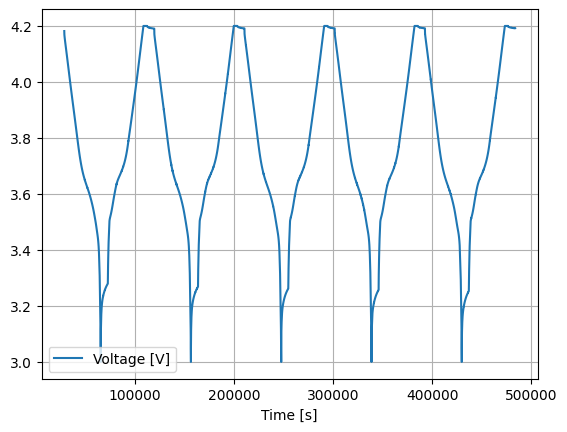

In [4]:
plt.figure()
cell.procedure["Sample"].experiment("Break-in Cycles").plot(
    x="Time [s]", y="Voltage [V]", grid=True
)

## HvPlot
Plots created using Matplotlib sometimes need a lot of work to look good, and they are not particularly interactive. [HvPlot](https://hvplot.holoviz.org/index.html) provides a high-level interface similar to plotting in pandas with the additional flexibility of specifying a more interactive backend. Note hvplot is an optional dependency, it can be installed seperately to enable this functionality.

In [5]:
cell.procedure["Sample"].experiment("Break-in Cycles").hvplot(
    x="Time [s]", y="Voltage [V]"
)

:Curve   [Time [s]]   (Voltage [V])

## Seaborn
Seaborn is a high-level plotting library built on top of matplotlib. It provides a clean interface for dataframes, while maintaining much of matplotlib's flexibility.

In PyProBE you can import a version of Seaborn customized to work with PyProBE objects directly:

In [6]:
from pyprobe.plot import seaborn as sns

This version of Seaborn can be interacted with as normal. The only difference is you are able to pass PyProBE `Result` objects directly to Seaborn plotting functions in their `data` argument:

<Axes: xlabel='Time [s]', ylabel='Voltage [V]'>

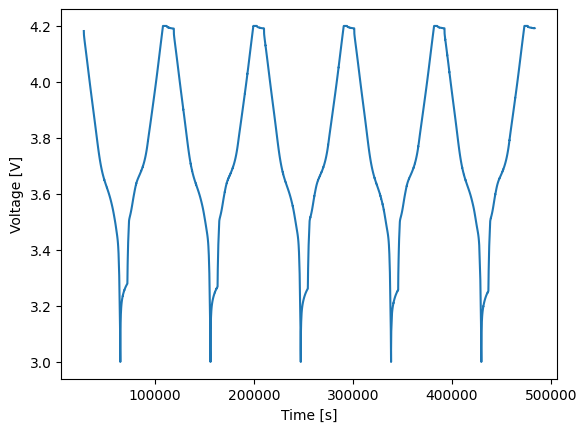

In [7]:
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles"),
    x="Time [s]",
    y="Voltage [V]",
)

Being built on matplotlib, Seaborn can interact natively with customisation features like subplots:

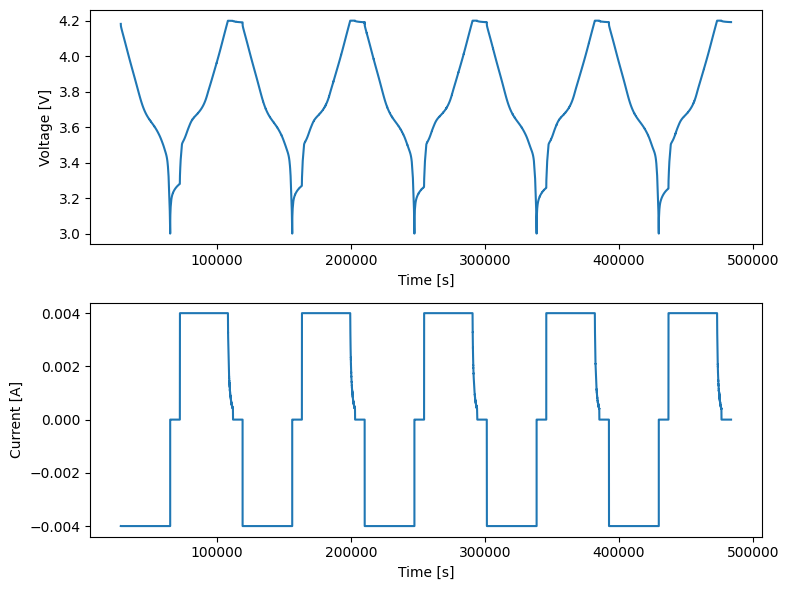

In [8]:
fig, ax = plt.subplots(2, 1, figsize=(8, 6))
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles"),
    x="Time [s]",
    y="Voltage [V]",
    ax=ax[0],
)
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles"),
    x="Time [s]",
    y="Current [A]",
    ax=ax[1],
)
plt.tight_layout()
plt.show()

Similarly, plots with two y axes can be created as usual:

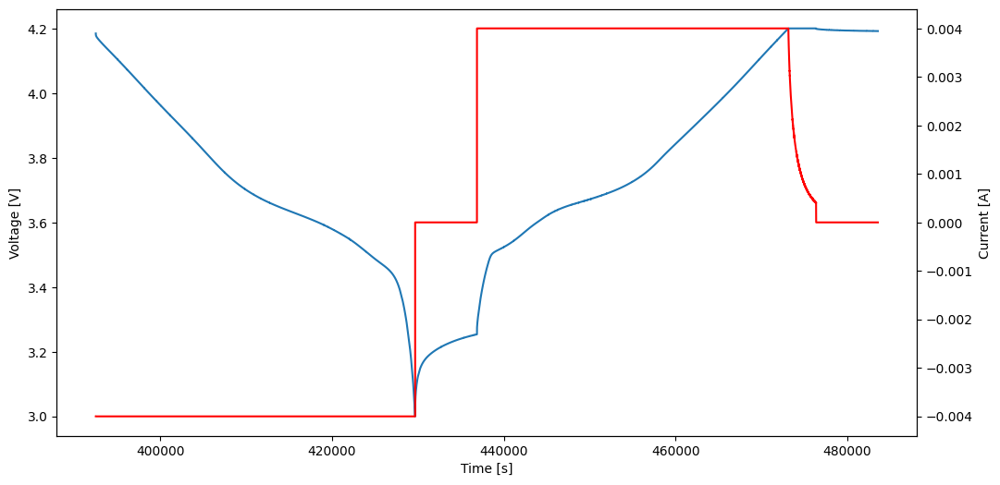

In [9]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles").cycle(-1),
    x="Time [s]",
    y="Voltage [V]",
    ax=ax,
)
ax2 = ax.twinx()
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles").cycle(-1),
    x="Time [s]",
    y="Current [A]",
    ax=ax2,
    color="r",
)
plt.show()

As for all the plotting methods demonstrated, built-in unit conversion is also present:

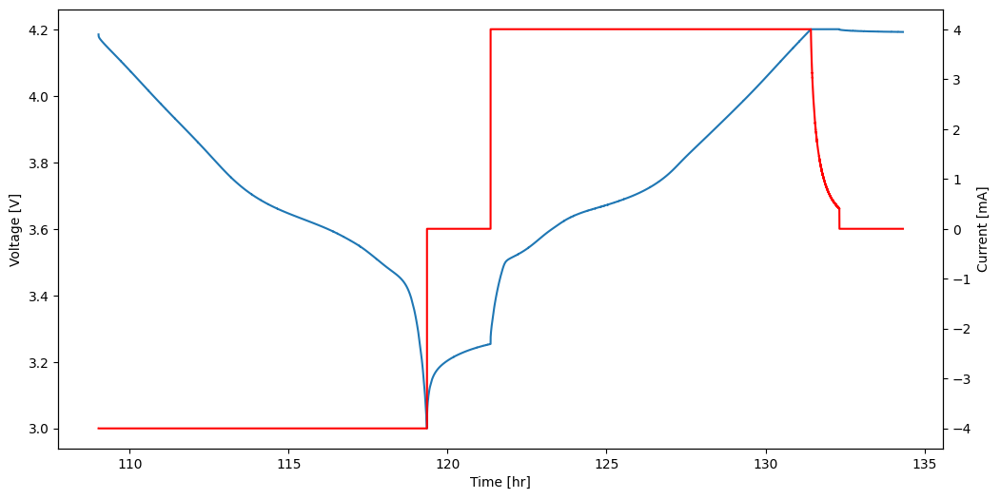

In [10]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles").cycle(-1),
    x="Time [hr]",
    y="Voltage [V]",
    ax=ax,
)
ax2 = ax.twinx()
sns.lineplot(
    data=cell.procedure["Sample"].experiment("Break-in Cycles").cycle(-1),
    x="Time [hr]",
    y="Current [mA]",
    ax=ax2,
    color="r",
)
plt.show()